# Setup

Before running, perform the following steps:
1. Download the results file from "https://www.dropbox.com/s/aj66ln24g2cp5td/results.csv?dl=0"
2. Upload the downloaded file to this document using the side bar

In [260]:
import pandas as pd
import numpy as np
import plotly.express as px
from google.colab import drive
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import seaborn as sns

In [261]:
raw_data = pd.read_csv("/content/results.csv")

In [262]:
#Set Algorithm row
raw_data["Algorithm"] = "null"
raw_data["Algorithm"] = np.where((raw_data["Algorithm Type"] == "list"), raw_data["Priority"]+"-"+raw_data["Placement"],raw_data["Algorithm"])
raw_data["Algorithm"] = np.where((raw_data["Algorithm Type"] == "clustering"), raw_data["Clusterer"]+"-"+raw_data["Merger"]+"-"+raw_data["Ordering"],raw_data["Algorithm"])

raw_data["Algorithm"].unique()

#Set CCR row
raw_data["CCR"] = 0.0
for index, row in raw_data.iterrows():
  strs = row["File name"].split("_")
  for i in range(len(strs)):
    if strs[i] == "CCR":
      ccr = strs[i+1]
      if ".gxl" in ccr :
        ccr = ccr.split(".gxl")[0]
      # print(ccr)
      raw_data.at[index,'CCR'] = float(ccr)

# Data analaysis and filtration

## Raw data

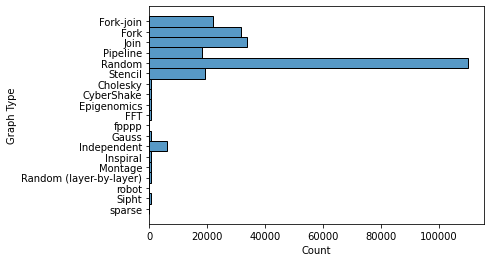

In [263]:
sns.histplot(data = raw_data, y = "Graph Type")

## Filtration

In [264]:
data = raw_data[raw_data["Speedup"] > 1]
discarded_data = raw_data[raw_data["Speedup"] <= 1]

px.histogram(discarded_data, "Graph Type")

## Filtered Data analysis

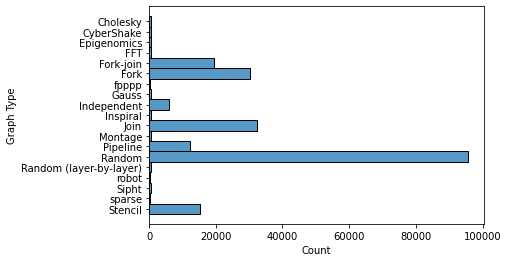

In [265]:
sns.histplot(data, y = "Graph Type")

### Attributes

In [266]:
print("Nodes")
px.histogram(data, "Num of Nodes").show()

print("CCR")
px.histogram(data, "CCR").show()

print("Num of Edges")
px.histogram(data, "Num of Edges").show()

print("Density")
px.histogram(data, "Density").show()

print("Speedup")
px.histogram(data, "Speedup").show()

Nodes


CCR


Num of Edges


Density


Speedup


# All Graphs

## Slack time analysis

### By Graph Type

In [267]:
sortedbytype = data.groupby("Graph Type", as_index= False)["Slack Time %"].mean().sort_values(by = "Slack Time %")["Graph Type"]

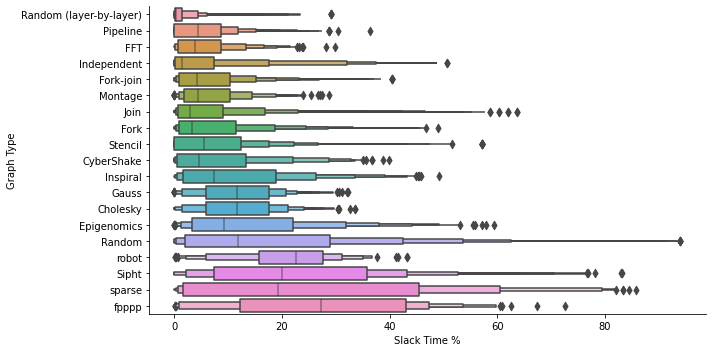

In [268]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Graph Type", aspect = 2, order = sortedbytype)

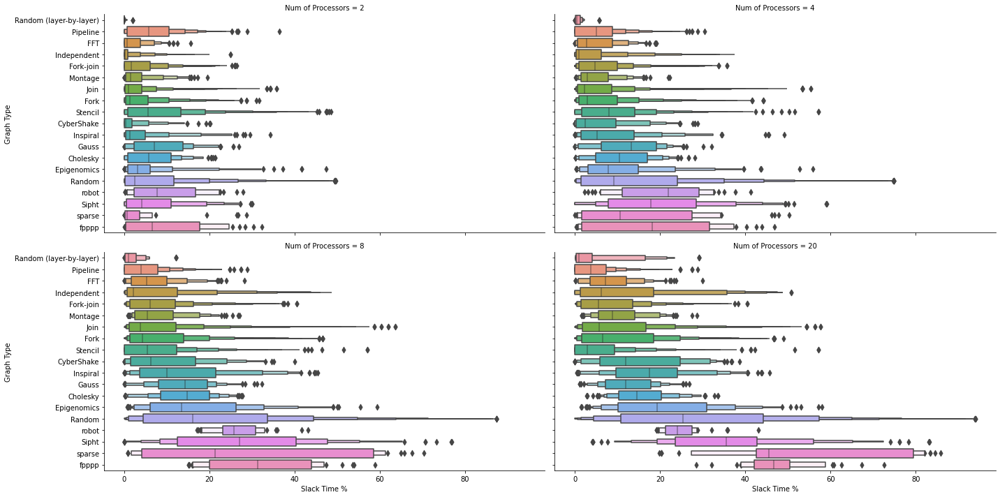

In [269]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = sortedbytype)

### By Scheduling algortihm

In [270]:
sortedbyalgorithm = data.groupby("Algorithm", as_index= False)["Slack Time %"].mean().sort_values(by = "Slack Time %")["Algorithm"]

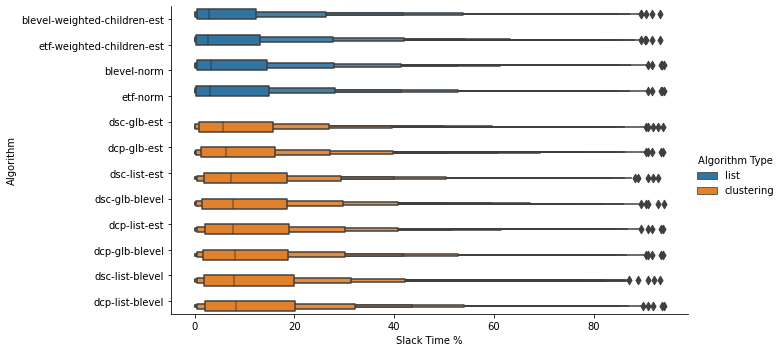

In [271]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = sortedbyalgorithm)

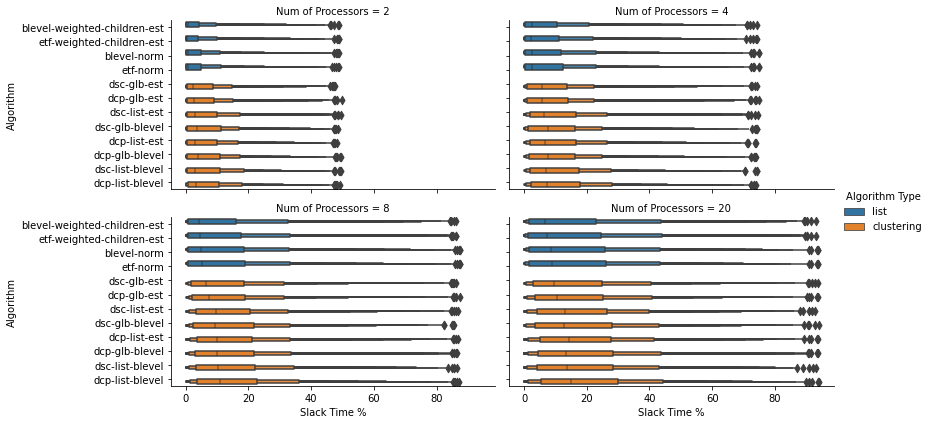

In [272]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = sortedbyalgorithm)

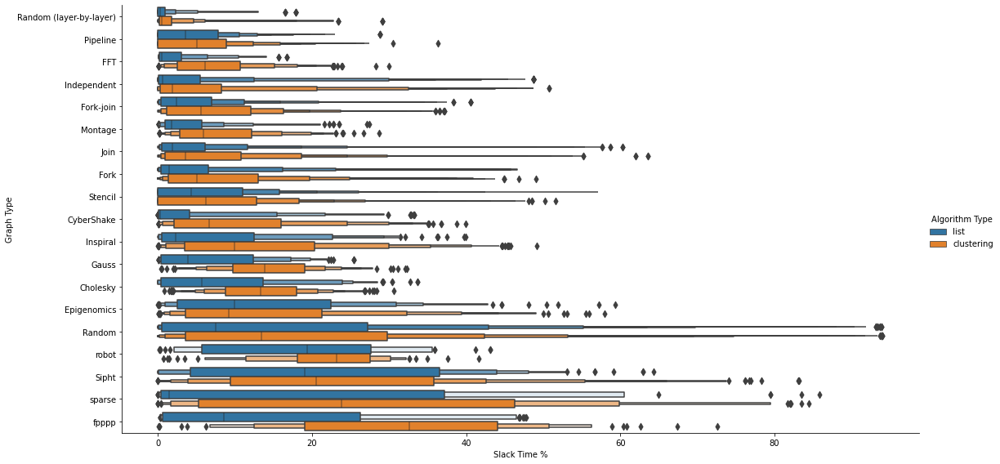

In [273]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = sortedbytype)

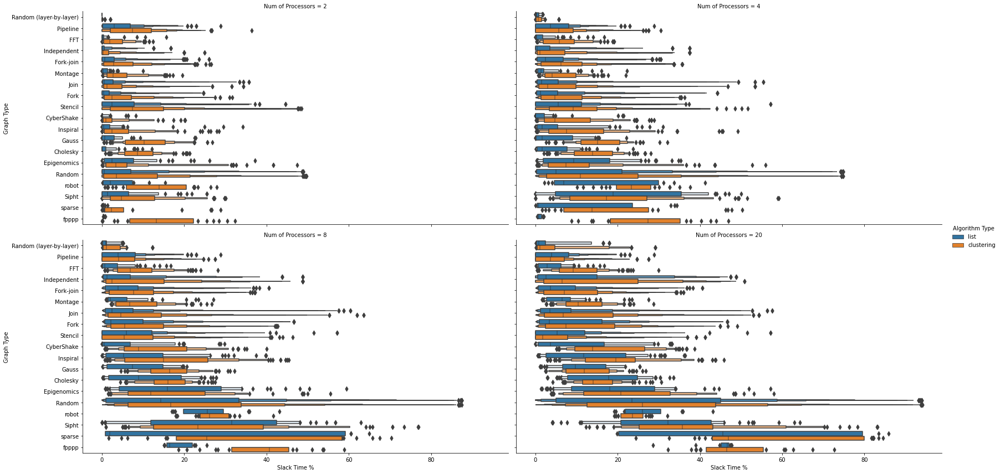

In [274]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Time %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = sortedbytype)

### By Efficiency

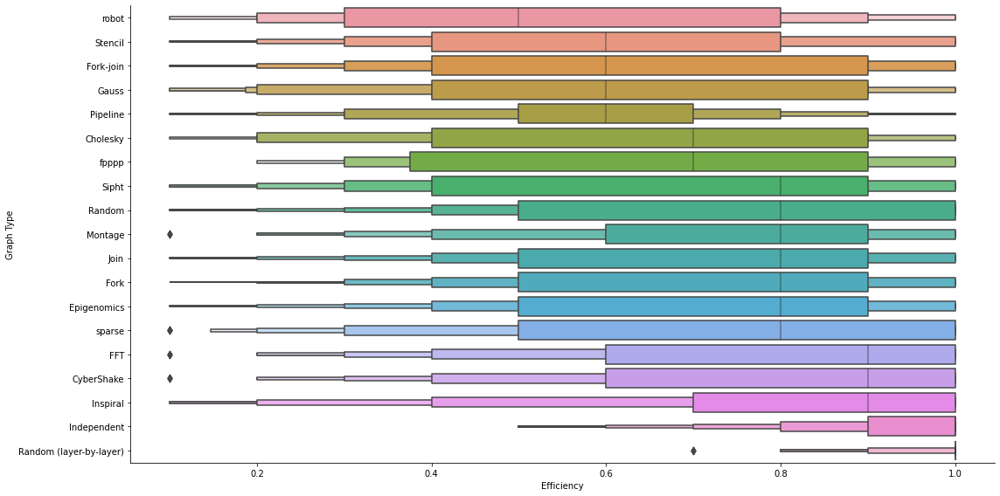

In [275]:
sns.catplot(data = data ,kind = "boxen", x = "Efficiency", y = "Graph Type",height = 8,aspect = 2, order =data.groupby("Graph Type", as_index= False)["Efficiency"].median().sort_values(by = "Efficiency")["Graph Type"])

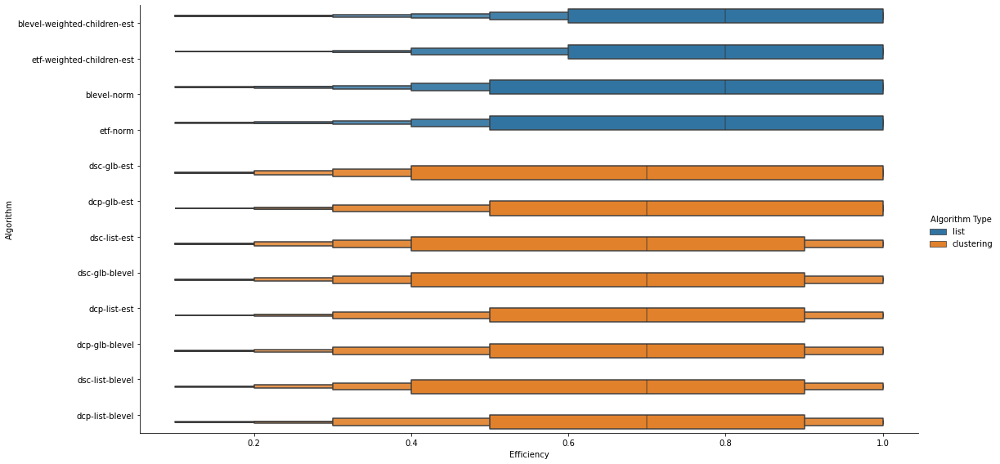

In [276]:
sns.catplot(data = data ,kind = "boxen", x = "Efficiency", y = "Algorithm", hue = "Algorithm Type",height = 8,aspect = 2, order = sortedbyalgorithm)

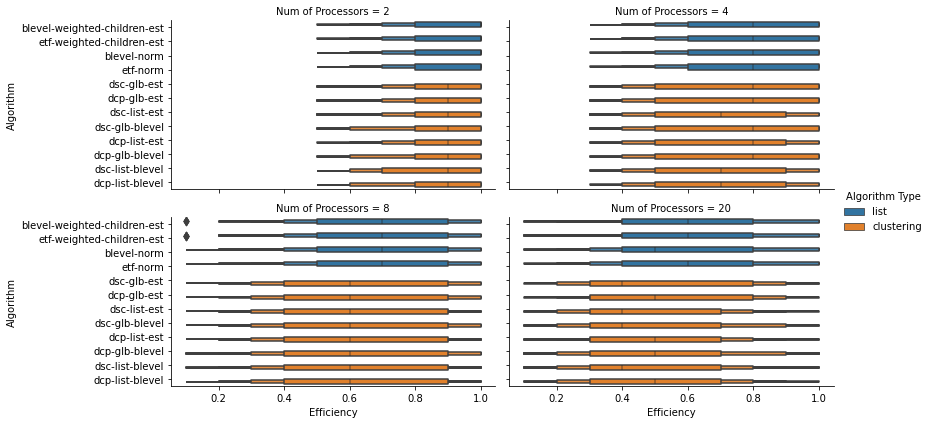

In [277]:
sns.catplot(data = data ,kind = "boxen", x = "Efficiency", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2,height = 3,aspect = 2, order = sortedbyalgorithm)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



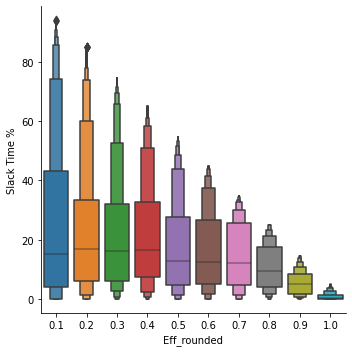

In [278]:
data["Eff_rounded"] = data["Efficiency"].round(1)
sns.catplot(data = data ,kind = "boxen", y = "Slack Time %", x = "Eff_rounded")

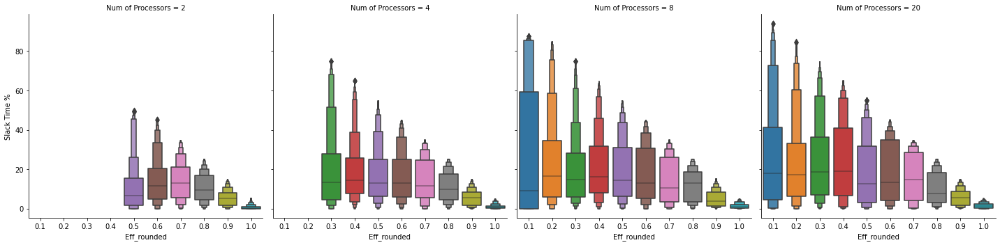

In [279]:
sns.catplot(data = data ,kind = "boxen", y = "Slack Time %",col = "Num of Processors", x = "Eff_rounded")

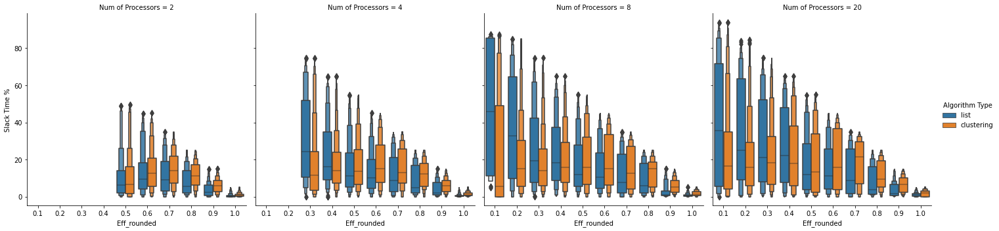

In [280]:
sns.catplot(data = data ,kind = "boxen", y = "Slack Time %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")

### By CCR

In [281]:
pd.set_option('display.max_rows', 100)
print(data[data["CCR"].isin([0.1,1,2,5,10])].groupby(["Graph Type", "CCR"])["CCR"].count())

Graph Type               CCR 
Cholesky                 0.1       240
                         1.0       240
                         10.0      240
CyberShake               0.1       240
                         1.0       240
                         10.0      240
Epigenomics              0.1       240
                         1.0       240
                         10.0      233
FFT                      0.1       240
                         1.0       240
                         10.0      240
Fork                     0.1      7104
                         1.0      3744
                         2.0      2976
                         5.0       336
                         10.0     2096
Fork-join                0.1      4800
                         1.0      3040
                         2.0      2097
                         5.0        48
                         10.0     1356
Gauss                    0.1       192
                         1.0       192
                         10.0     

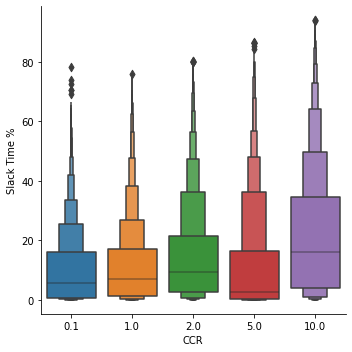

In [282]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Slack Time %", x = "CCR")

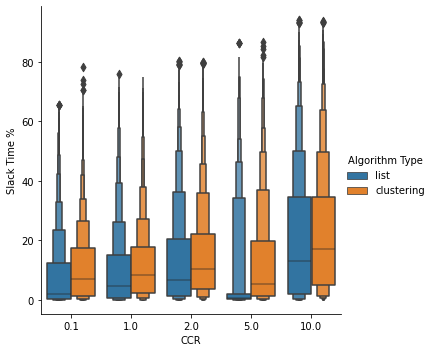

In [283]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen",hue = "Algorithm Type", y = "Slack Time %", x = "CCR")

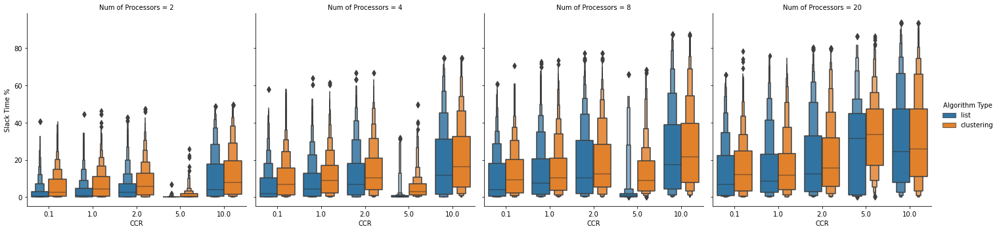

In [284]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Slack Time %",hue = "Algorithm Type",col = "Num of Processors", x = "CCR")

### By Density


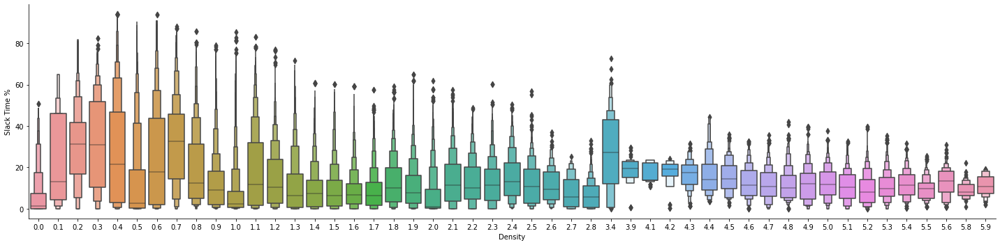

In [285]:
sns.catplot(data = data, kind = "boxen", x = "Density", y ='Slack Time %', aspect = 4)

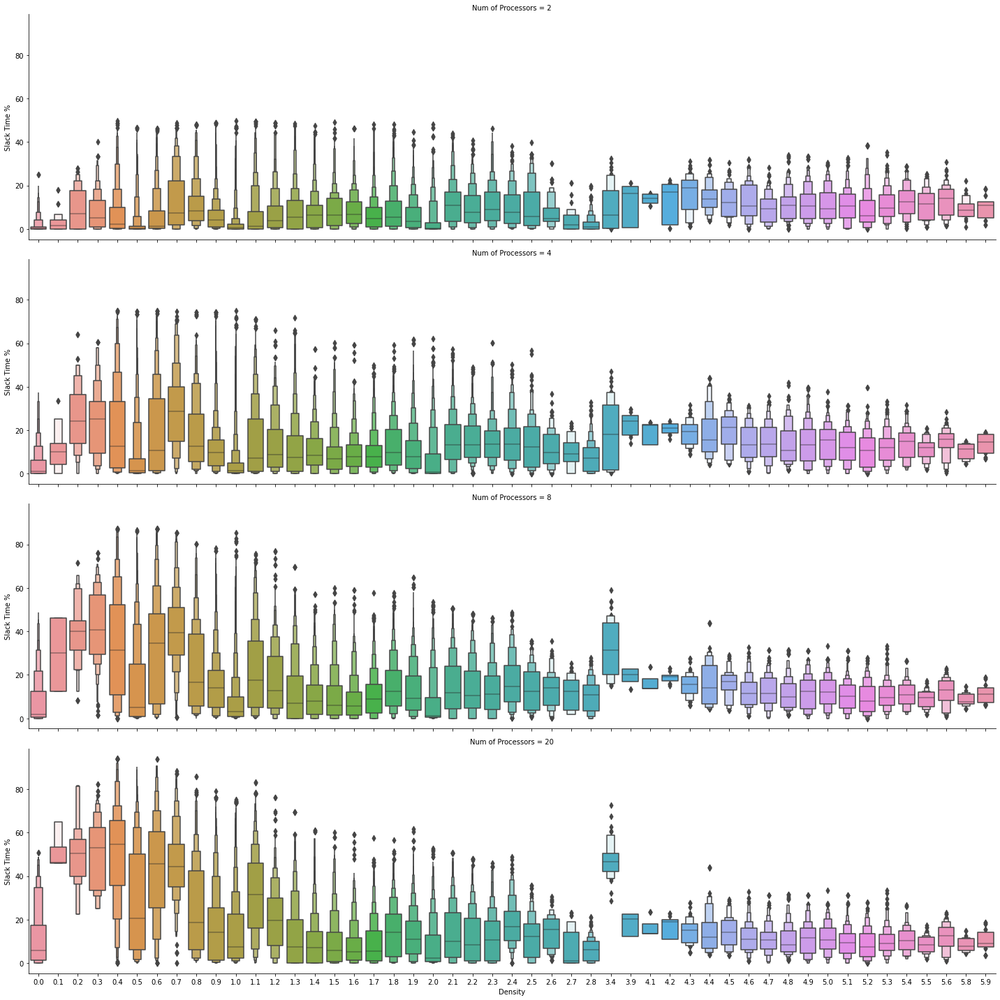

In [286]:
sns.catplot(data = data, kind = "boxen", x = "Density", y ='Slack Time %', row = "Num of Processors",  aspect = 4)

## Idle Time analysis

### By Graph Type

In [287]:
idlebytype = data.groupby("Graph Type", as_index= False)["Idle Time %"].median().sort_values(by = "Idle Time %")["Graph Type"]

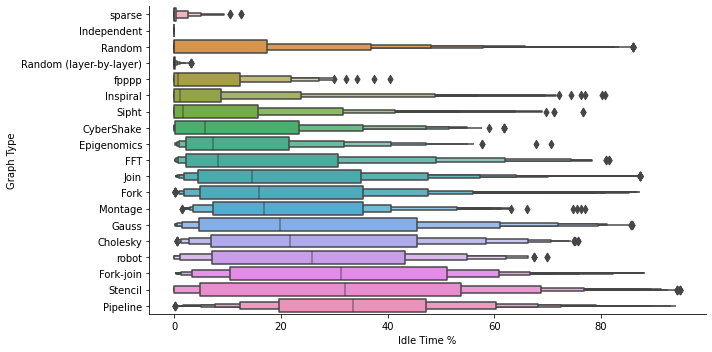

In [288]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Graph Type", aspect = 2, order = idlebytype)

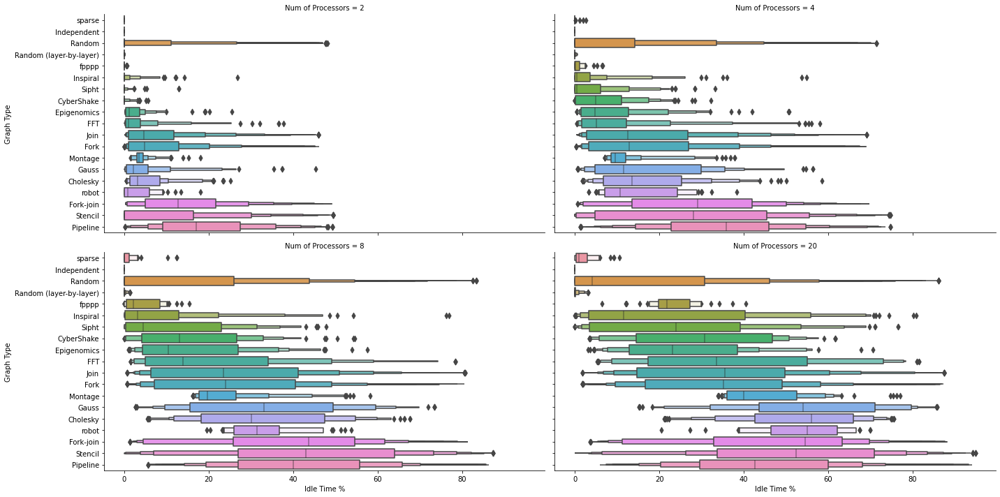

In [289]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = idlebytype)

### By Scheduling algortihm

In [290]:
idlebyalgorithm = data.groupby("Algorithm", as_index= False)["Idle Time %"].mean().sort_values(by = "Idle Time %")["Algorithm"]

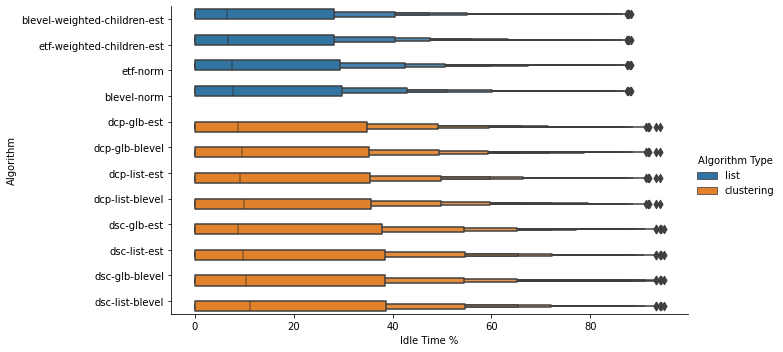

In [291]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = idlebyalgorithm)

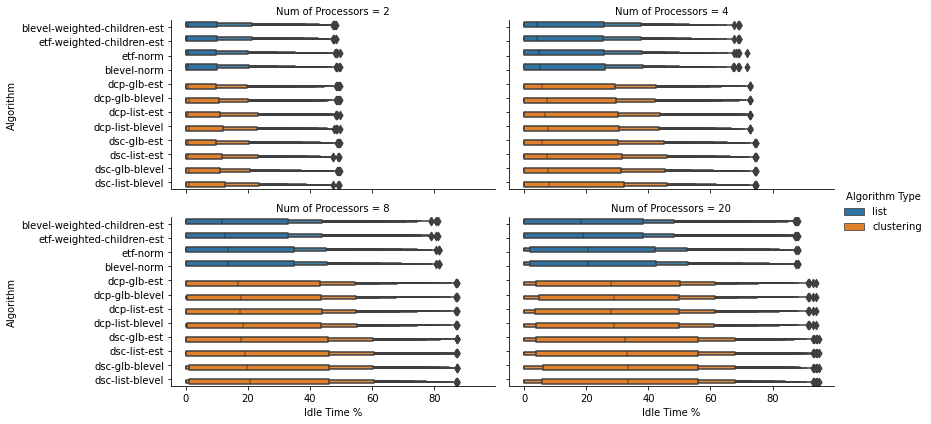

In [292]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = idlebyalgorithm)

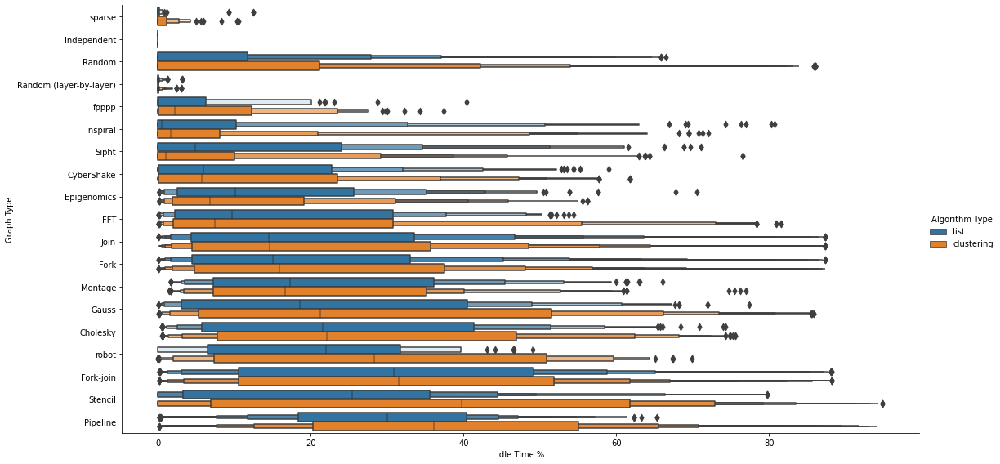

In [293]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = idlebytype)

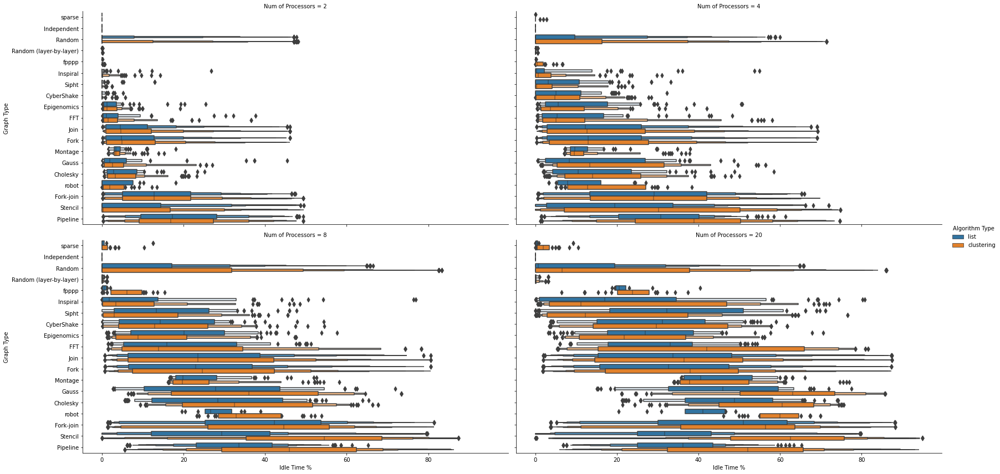

In [294]:
sns.catplot(data = data ,kind = "boxen", x = "Idle Time %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = idlebytype)

### By Efficiency

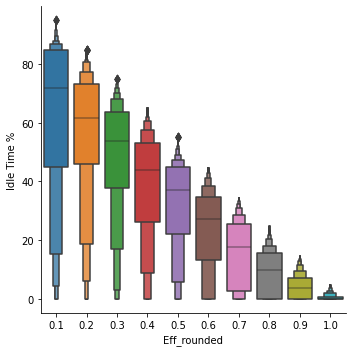

In [295]:
sns.catplot(data = data ,kind = "boxen", y = "Idle Time %", x = "Eff_rounded")

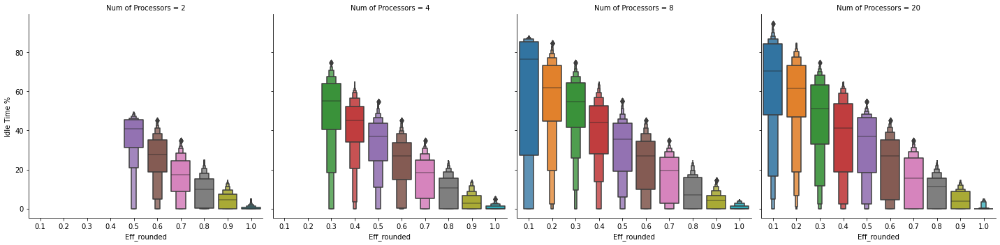

In [296]:
sns.catplot(data = data ,kind = "boxen", y = "Idle Time %",col = "Num of Processors", x = "Eff_rounded")

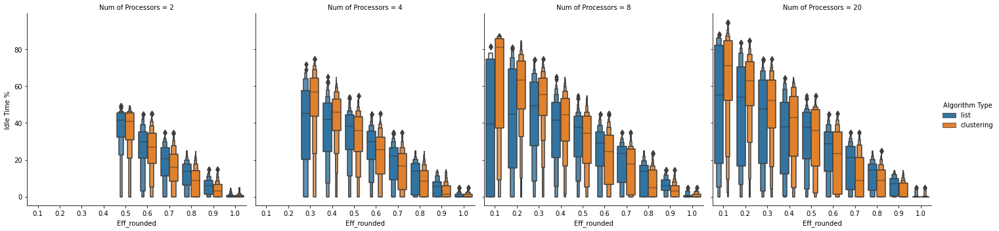

In [297]:
sns.catplot(data = data ,kind = "boxen", y = "Idle Time %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")

### By CCR

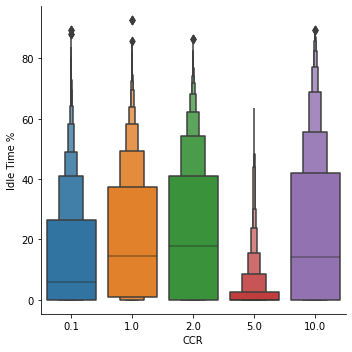

In [298]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Idle Time %", x = "CCR")

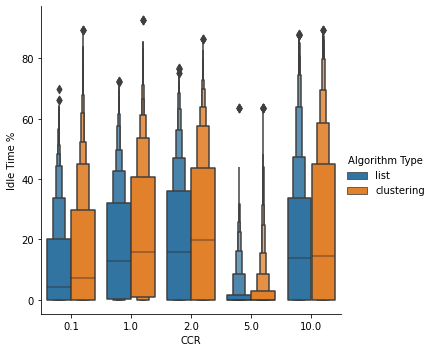

In [299]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen",hue = "Algorithm Type", y = "Idle Time %", x = "CCR")

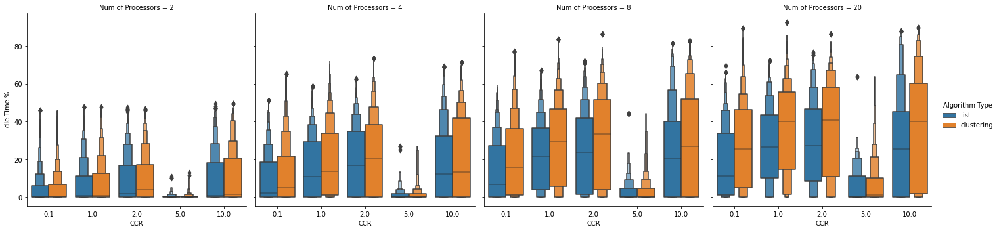

In [300]:
sns.catplot(data = data[data["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Idle Time %",hue = "Algorithm Type",col = "Num of Processors", x = "CCR")

### By Density

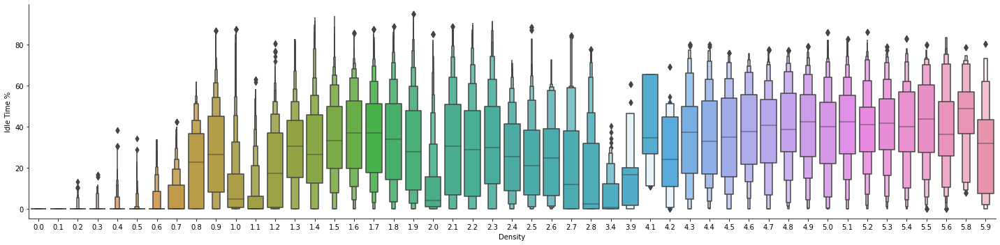

In [301]:
sns.catplot(data = data, kind = "boxen", x = "Density", y ='Idle Time %', aspect = 4)

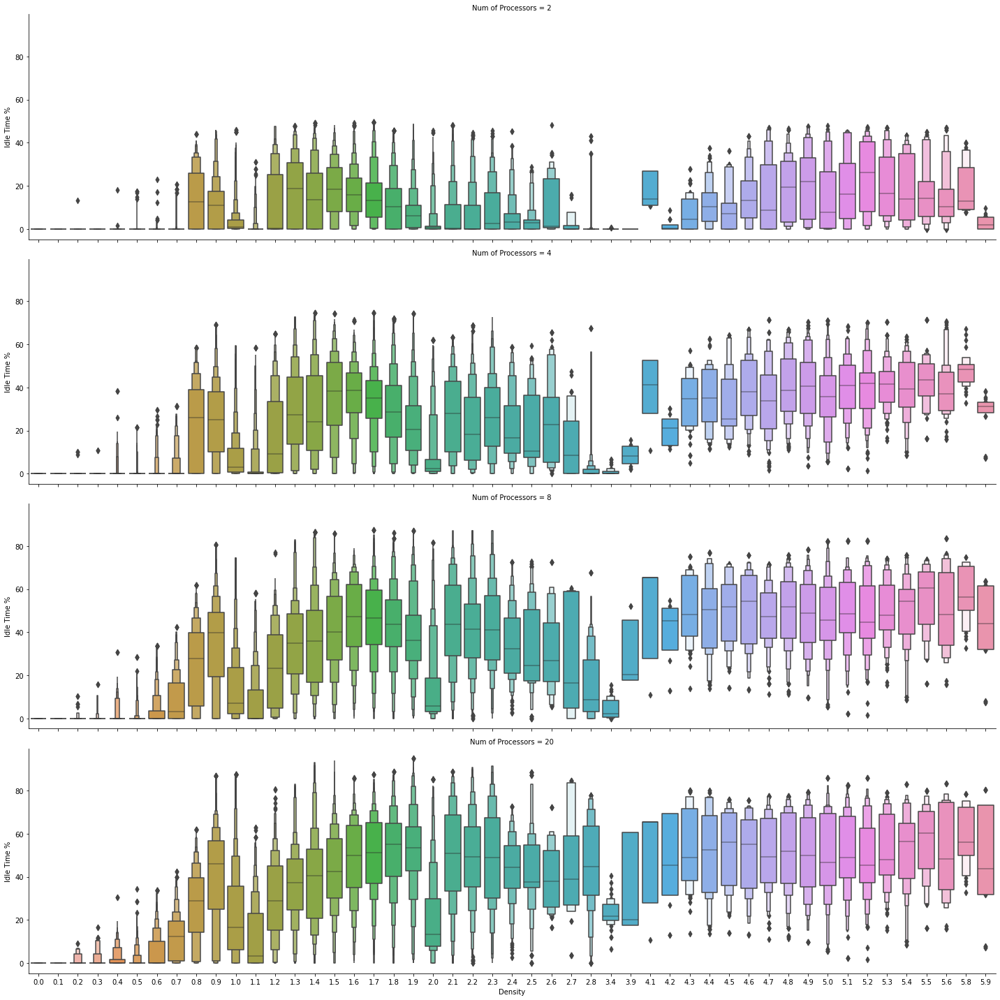

In [302]:
sns.catplot(data = data, kind = "boxen", x = "Density", y ='Idle Time %', aspect = 4, row = "Num of Processors")

## Slack Chunk analysis

### By Graph Type

In [303]:
sortedbytype = data.groupby("Graph Type", as_index= False)["Slack Chunk %"].median().sort_values(by = "Slack Chunk %")["Graph Type"]

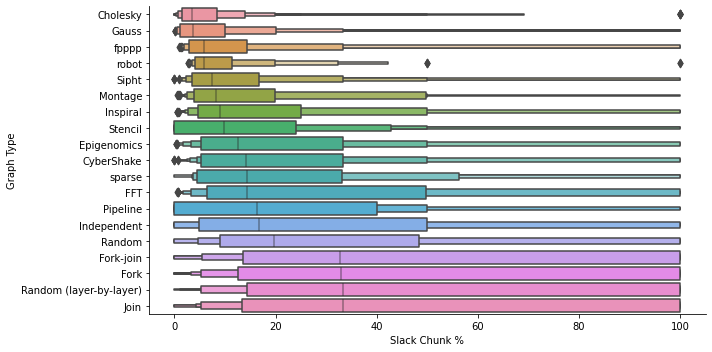

In [304]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", aspect = 2, order = sortedbytype)

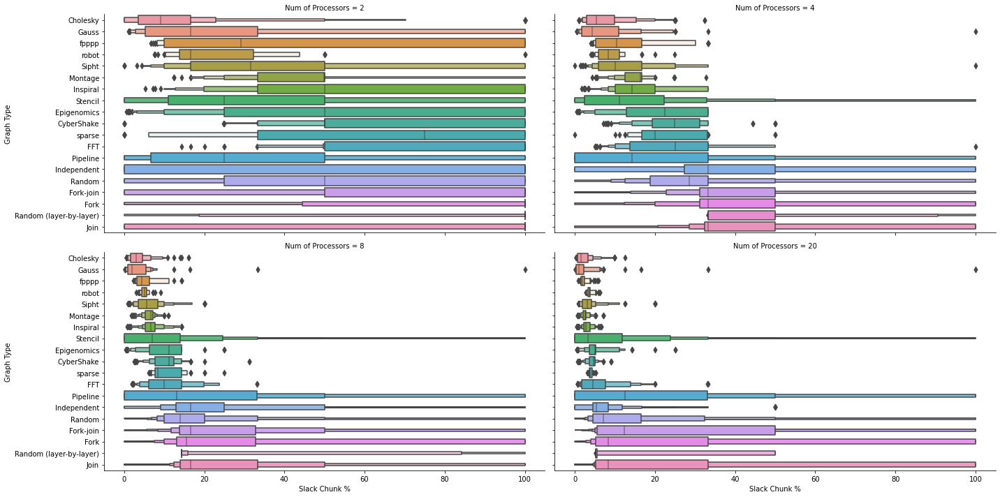

In [305]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = sortedbytype)

### By Scheduling algortihm

In [306]:
sortedbyalgorithm = data.groupby("Algorithm", as_index= False)["Slack Chunk %"].mean().sort_values(by = "Slack Chunk %")["Algorithm"]

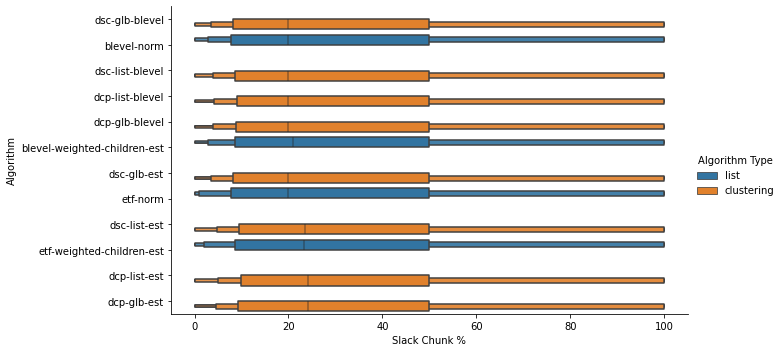

In [307]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = sortedbyalgorithm)

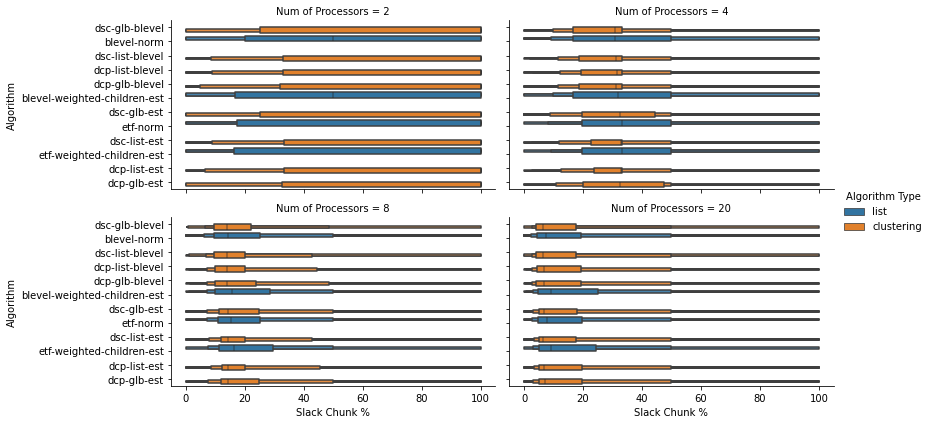

In [308]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = sortedbyalgorithm)

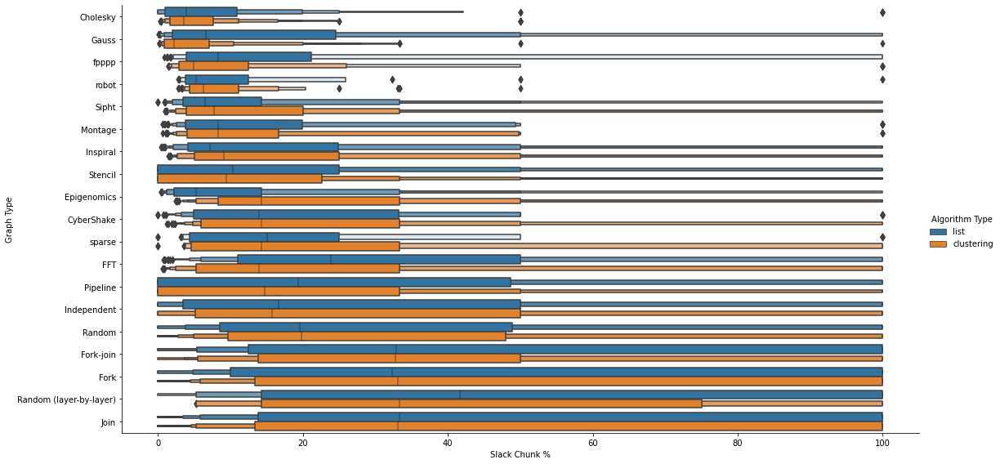

In [309]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = sortedbytype)

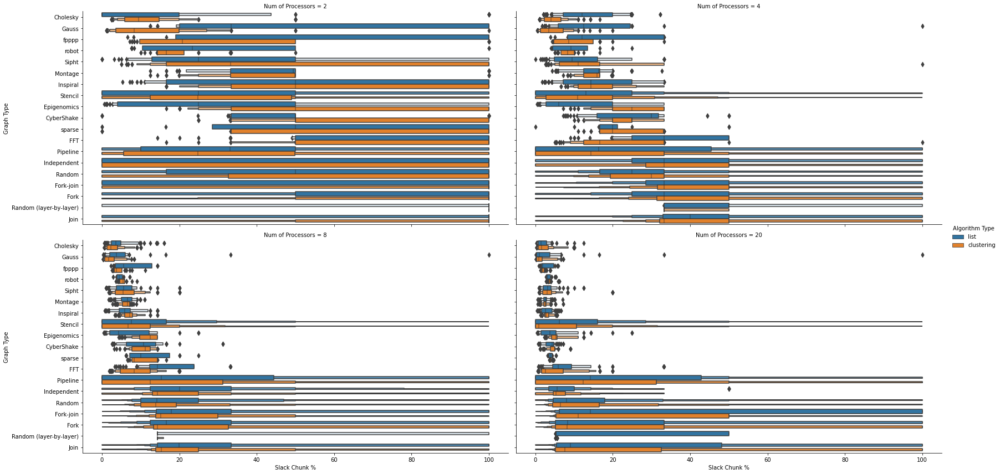

In [310]:
sns.catplot(data = data ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = sortedbytype)

### By Efficiency

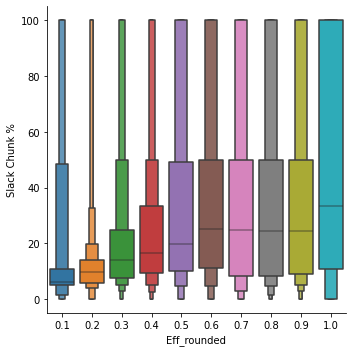

In [311]:
sns.catplot(data = data ,kind = "boxen", y = "Slack Chunk %", x = "Eff_rounded")

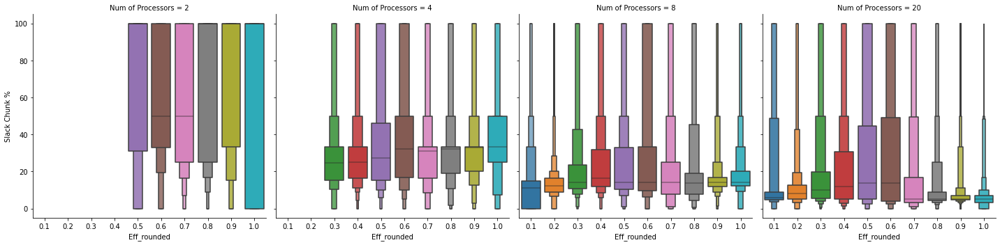

In [312]:
sns.catplot(data = data ,kind = "boxen", y = "Slack Chunk %",col = "Num of Processors", x = "Eff_rounded")

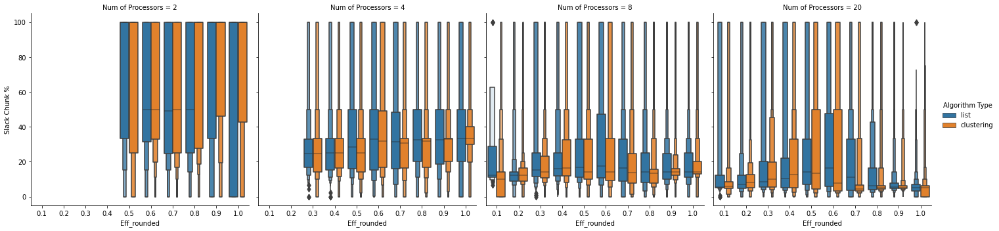

In [313]:
sns.catplot(data = data ,kind = "boxen", y = "Slack Chunk %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")

# Only high number graphs

## Filtered Data analysis

In [314]:
data2 = data[data["Graph Type"].isin(['Fork', 'Fork-join', 'Join', 'Pipeline','Random', 'Stencil']) ]

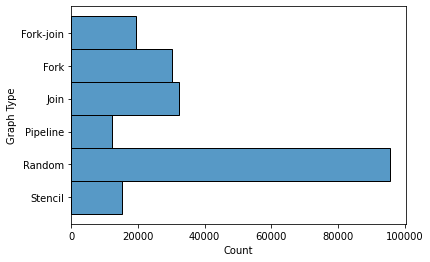

In [315]:
sns.histplot(data2, y = "Graph Type")

### Attributes

In [316]:
print("Nodes")
px.histogram(data2, "Num of Nodes").show()

print("CCR")
px.histogram(data2, "CCR").show()

print("Num of Edges")
px.histogram(data2, "Num of Edges").show()

print("Density")
px.histogram(data2, "Density").show()

print("Speedup")
px.histogram(data2, "Speedup").show()

Nodes


CCR


Num of Edges


Density


Speedup


## Slack time analysis

### By Graph Type

In [317]:
sortedbytype = data2.groupby("Graph Type", as_index= False)["Slack Time %"].mean().sort_values(by = "Slack Time %")["Graph Type"]

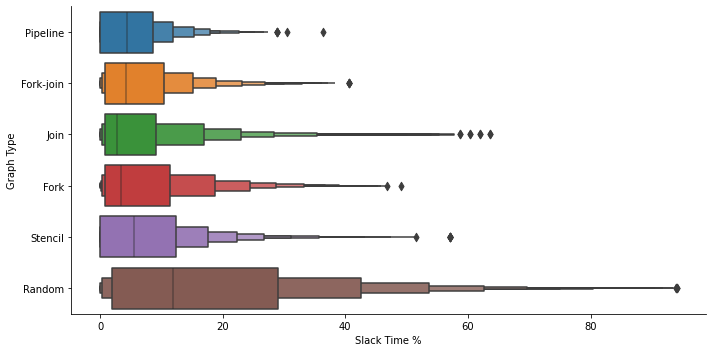

In [318]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Graph Type", aspect = 2, order = sortedbytype)

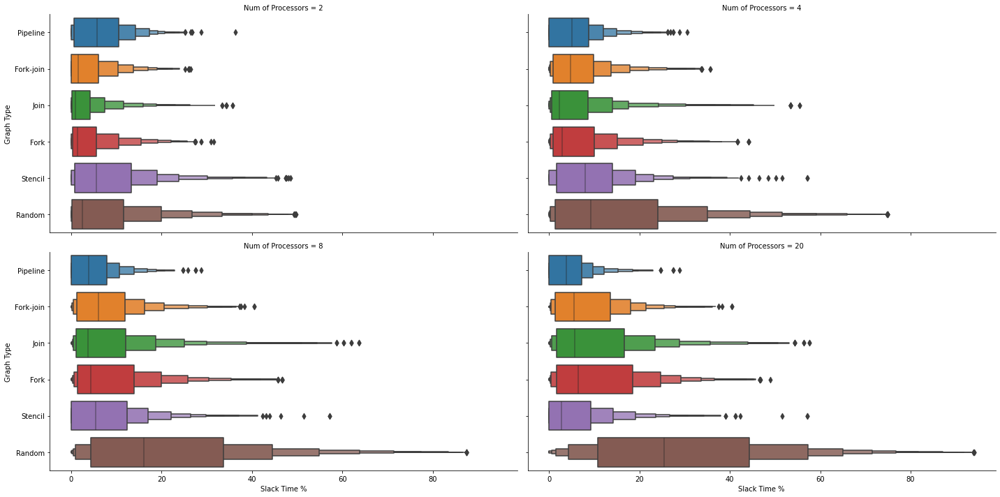

In [319]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = sortedbytype)

### By Scheduling algortihm

In [320]:
sortedbyalgorithm = data2.groupby("Algorithm", as_index= False)["Slack Time %"].mean().sort_values(by = "Slack Time %")["Algorithm"]

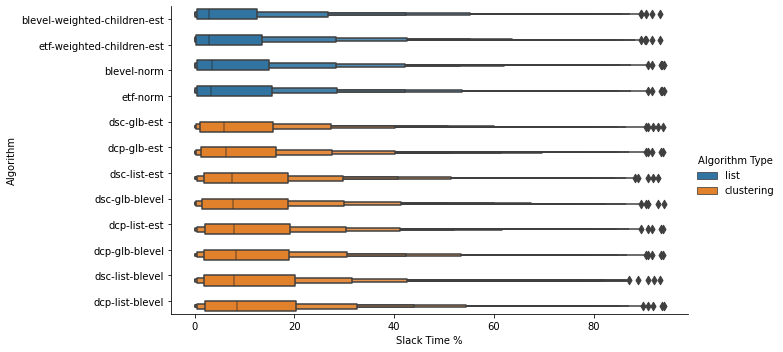

In [321]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = sortedbyalgorithm)

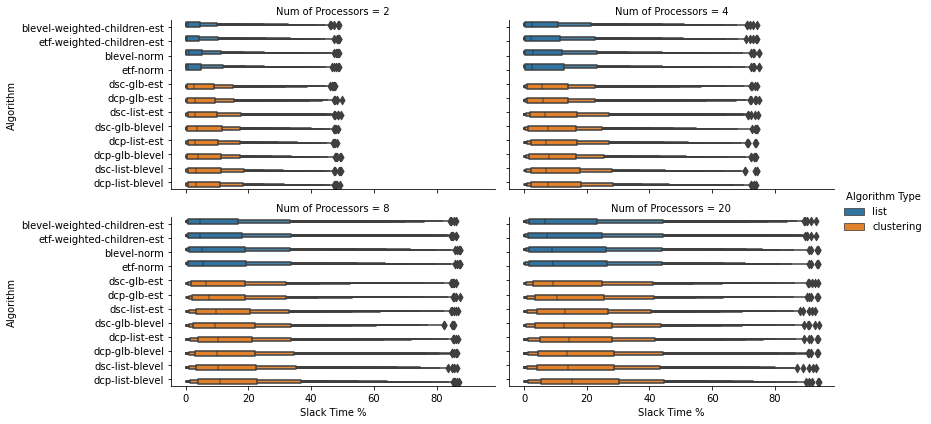

In [322]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = sortedbyalgorithm)

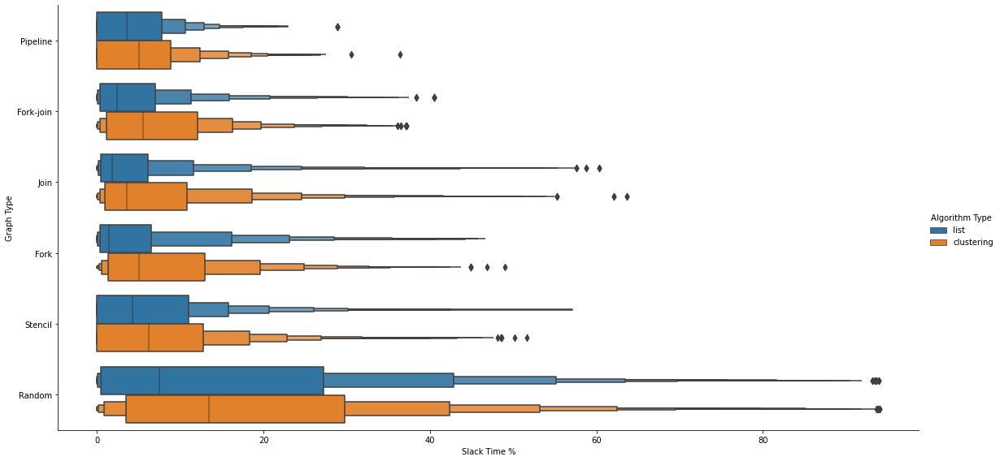

In [323]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = sortedbytype)

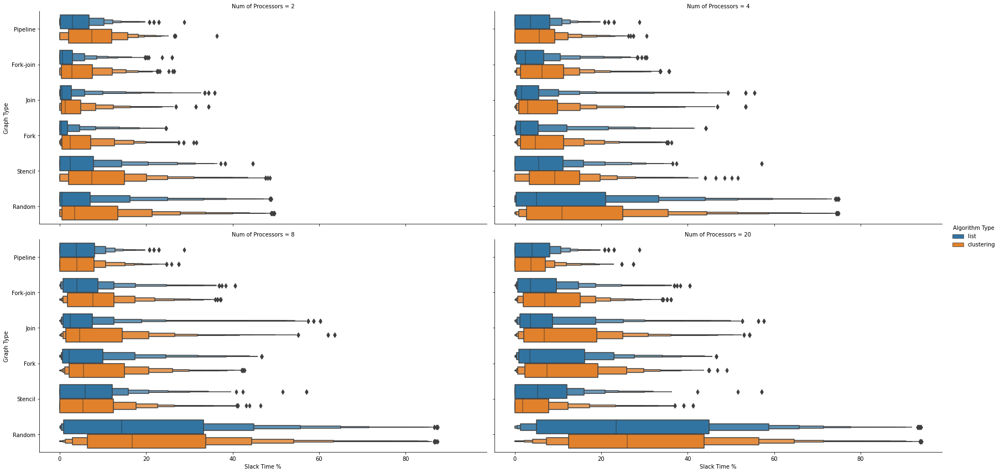

In [324]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Time %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = sortedbytype)

### By Efficiency

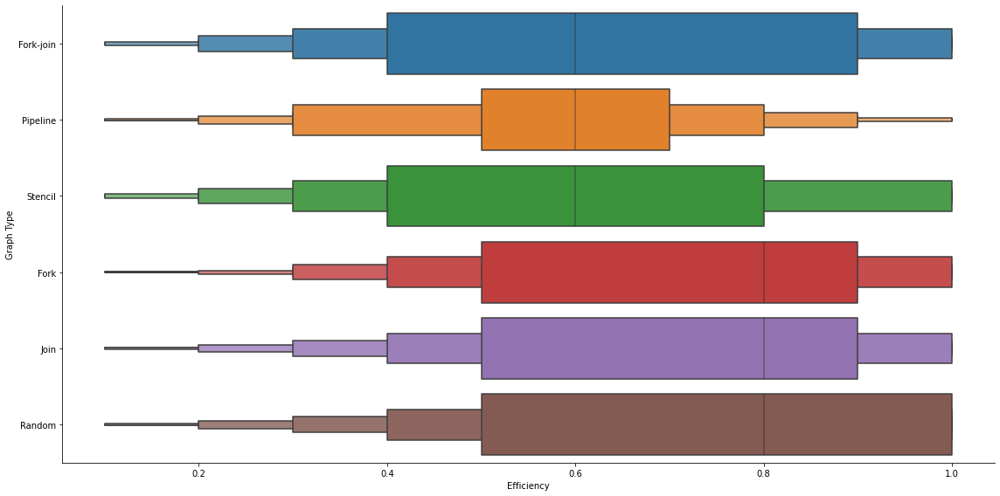

In [325]:
sns.catplot(data = data2 ,kind = "boxen", x = "Efficiency", y = "Graph Type",height = 8,aspect = 2, order =data2.groupby("Graph Type", as_index= False)["Efficiency"].median().sort_values(by = "Efficiency")["Graph Type"])

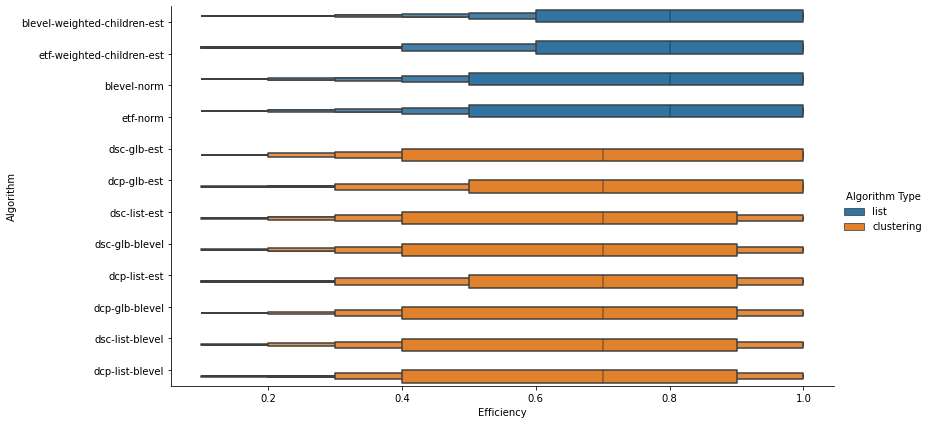

In [326]:
sns.catplot(data = data2 ,kind = "boxen", x = "Efficiency", y = "Algorithm", hue = "Algorithm Type",height = 6,aspect = 2, order = sortedbyalgorithm)

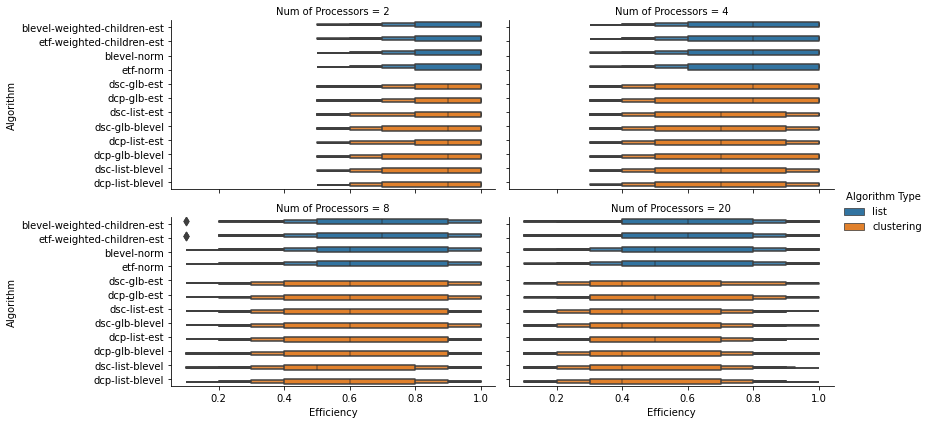

In [327]:
sns.catplot(data = data2 ,kind = "boxen", x = "Efficiency", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2,height = 3,aspect = 2, order = sortedbyalgorithm)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



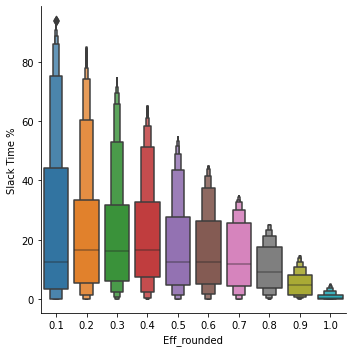

In [328]:
data2["Eff_rounded"] = data2["Efficiency"].round(1)
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Time %", x = "Eff_rounded")

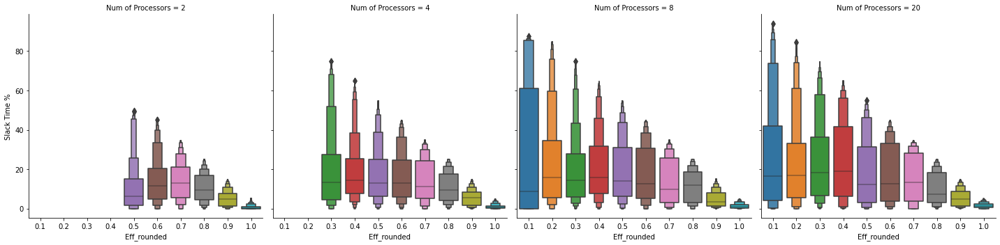

In [329]:
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Time %",col = "Num of Processors", x = "Eff_rounded")

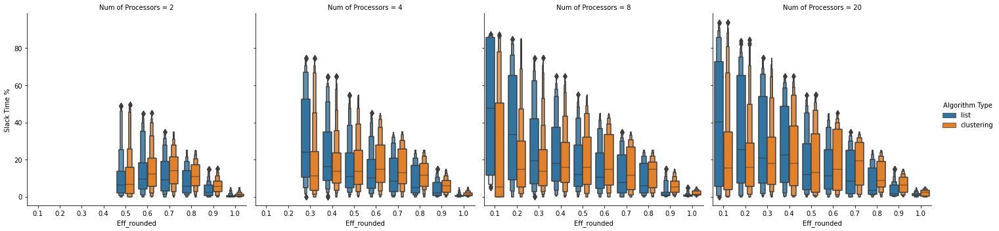

In [330]:
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Time %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")

### By CCR

In [331]:
pd.set_option('display.max_rows', 100)
print(data2[data2["CCR"].isin([0.1,1,2,5,10])].groupby(["Graph Type", "CCR"])["CCR"].count())

Graph Type  CCR 
Fork        0.1      7104
            1.0      3744
            2.0      2976
            5.0       336
            10.0     2096
Fork-join   0.1      4800
            1.0      3040
            2.0      2097
            5.0        48
            10.0     1356
Join        0.1      7200
            1.0      3984
            2.0      3168
            5.0       576
            10.0     2364
Pipeline    0.1      2400
            1.0      1296
            2.0       568
            10.0      373
Random      0.1     24528
            1.0     12144
            2.0     10160
            5.0      2160
            10.0     8761
Stencil     0.1      2448
            1.0      1432
            2.0       812
            10.0      564
Name: CCR, dtype: int64


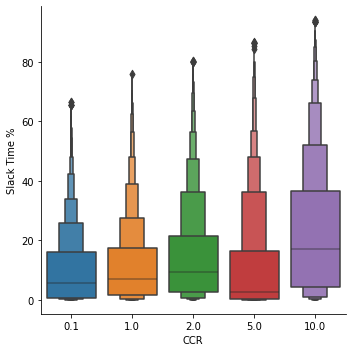

In [332]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Slack Time %", x = "CCR")

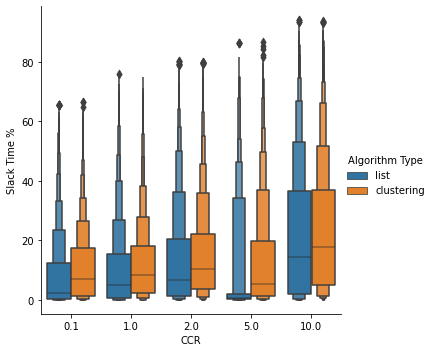

In [333]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen",hue = "Algorithm Type", y = "Slack Time %", x = "CCR")

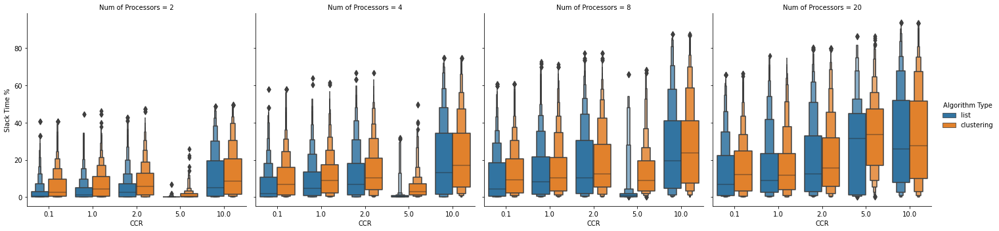

In [334]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Slack Time %",hue = "Algorithm Type",col = "Num of Processors", x = "CCR")

### By Density


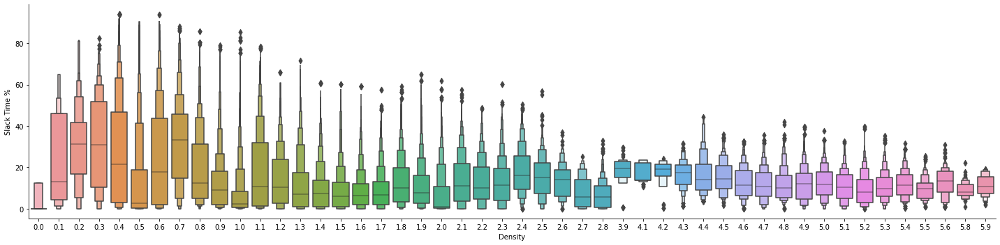

In [335]:
sns.catplot(data = data2, kind = "boxen", x = "Density", y ='Slack Time %', aspect = 4)

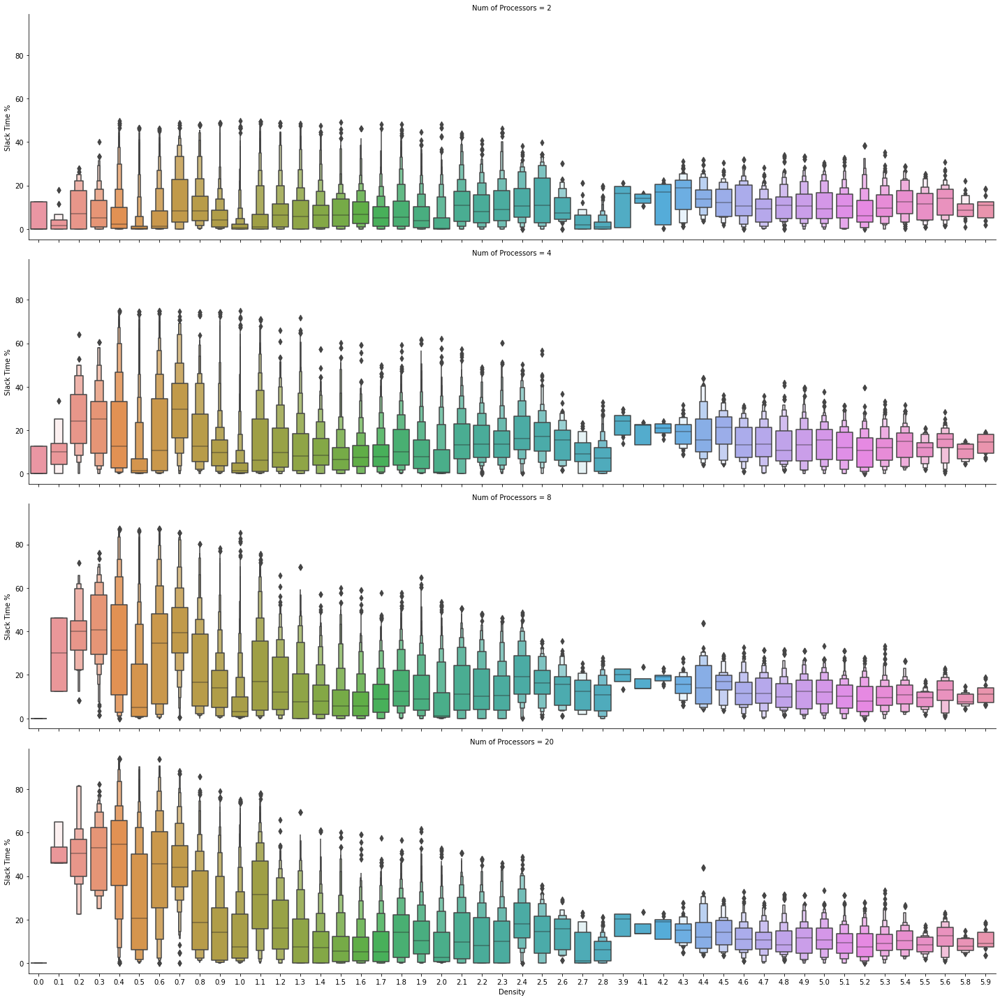

In [336]:
sns.catplot(data = data2, kind = "boxen", x = "Density", y ='Slack Time %', row = "Num of Processors",  aspect = 4)

## Idle Time analysis

### By Graph Type

In [337]:
idlebytype = data2.groupby("Graph Type", as_index= False)["Idle Time %"].median().sort_values(by = "Idle Time %")["Graph Type"]

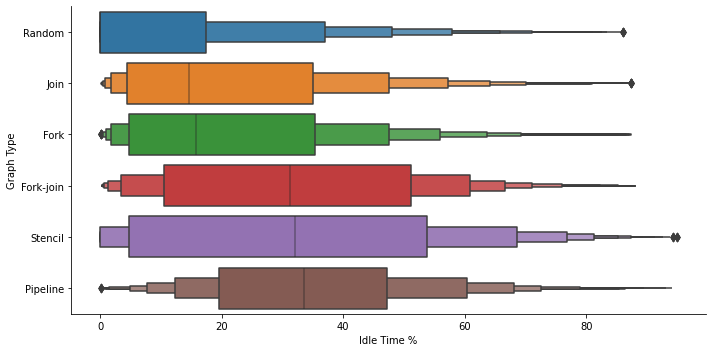

In [338]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Graph Type", aspect = 2, order = idlebytype)

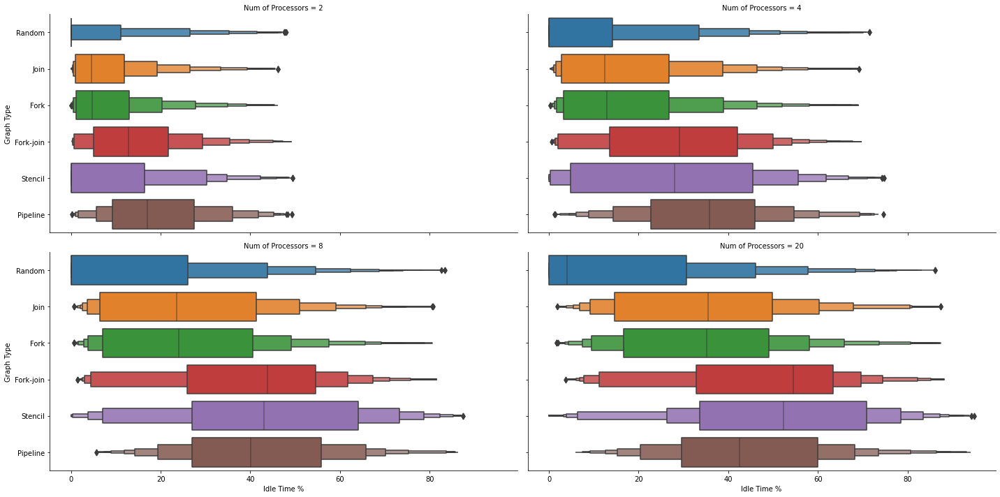

In [339]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = idlebytype)

### By Scheduling algortihm

In [340]:
idlebyalgorithm = data2.groupby("Algorithm", as_index= False)["Idle Time %"].mean().sort_values(by = "Idle Time %")["Algorithm"]

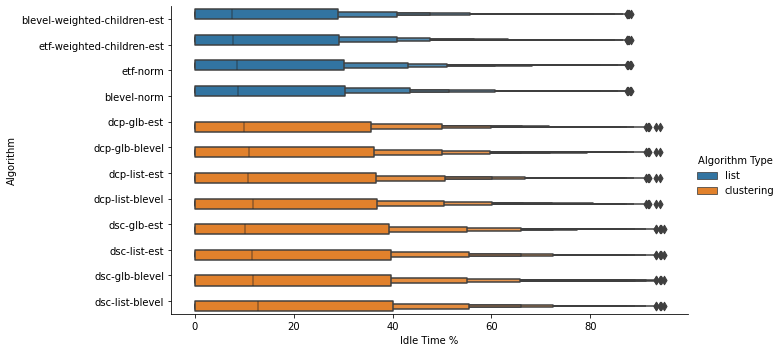

In [341]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = idlebyalgorithm)

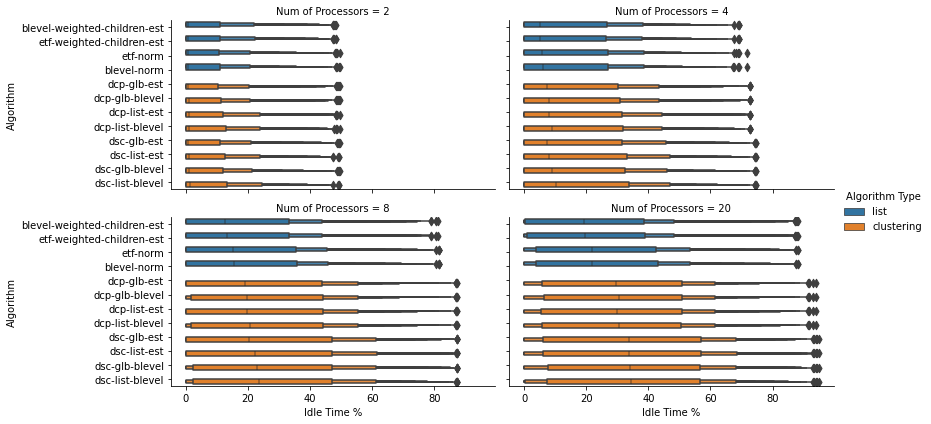

In [342]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = idlebyalgorithm)

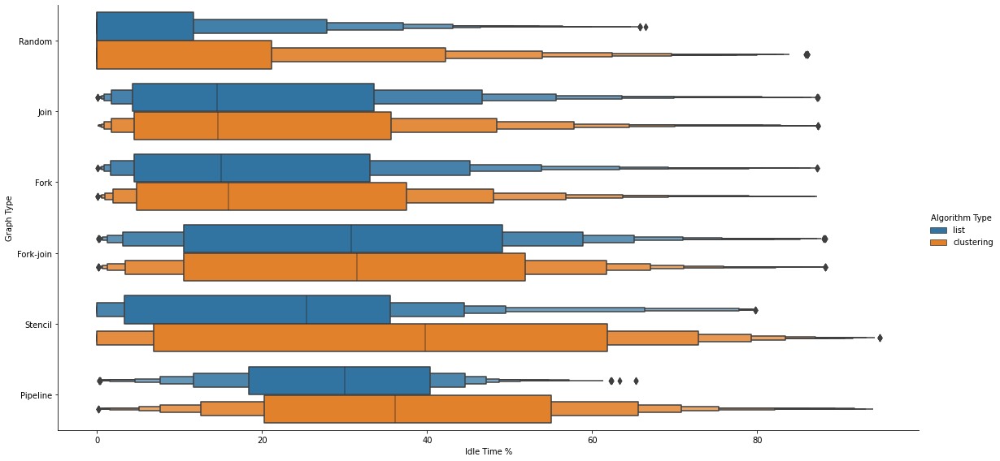

In [343]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = idlebytype)

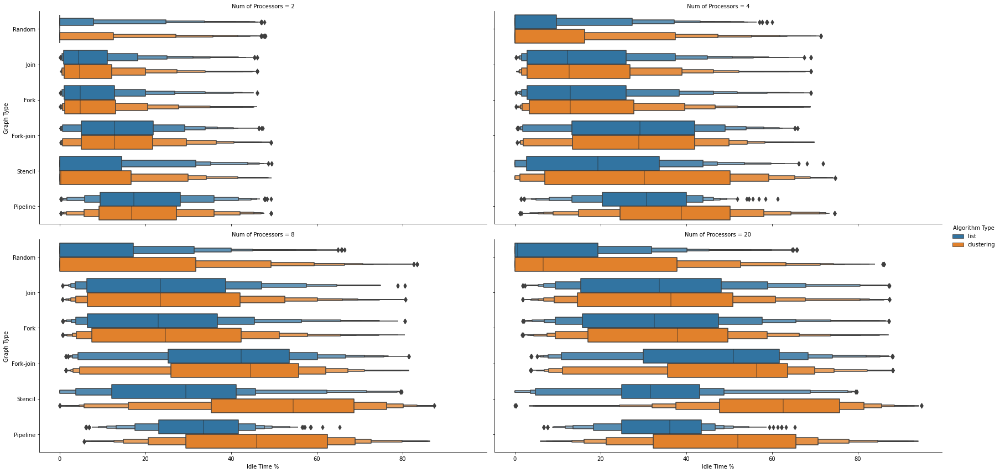

In [344]:
sns.catplot(data = data2 ,kind = "boxen", x = "Idle Time %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = idlebytype)

### By Efficiency

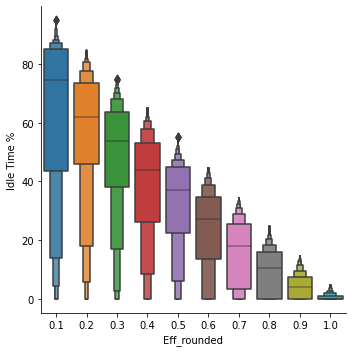

In [345]:
sns.catplot(data = data2 ,kind = "boxen", y = "Idle Time %", x = "Eff_rounded")

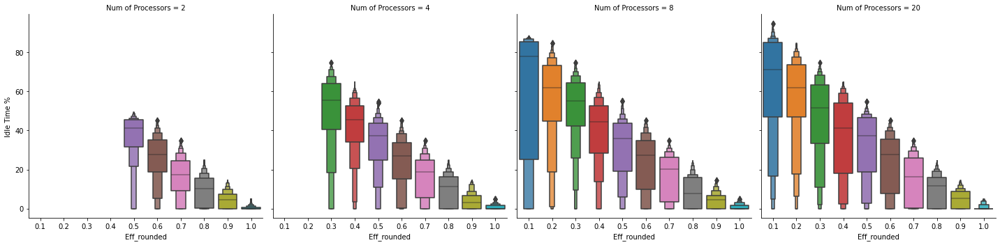

In [346]:
sns.catplot(data = data2 ,kind = "boxen", y = "Idle Time %",col = "Num of Processors", x = "Eff_rounded")

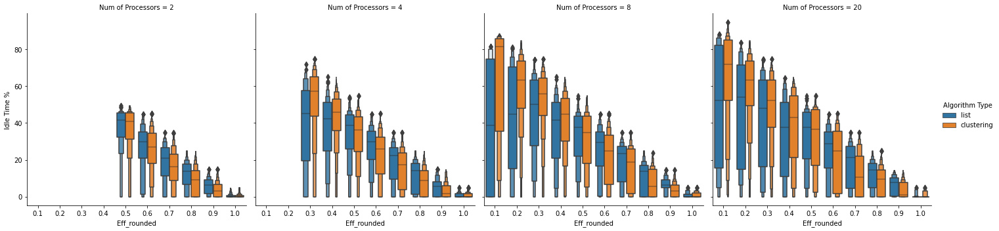

In [347]:
sns.catplot(data = data2 ,kind = "boxen", y = "Idle Time %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")

### By CCR

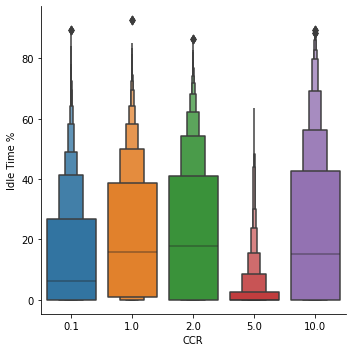

In [348]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Idle Time %", x = "CCR")

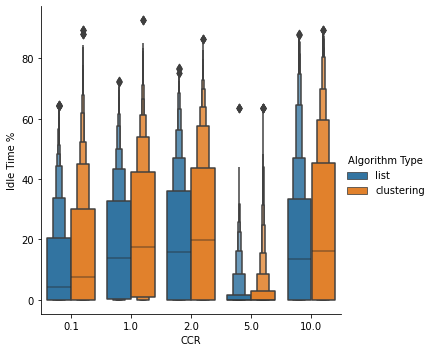

In [349]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen",hue = "Algorithm Type", y = "Idle Time %", x = "CCR")

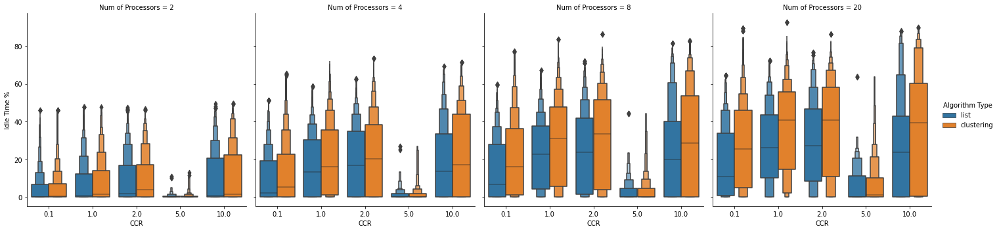

In [350]:
sns.catplot(data = data2[data2["CCR"].isin([0.1,1,2,5,10])] ,kind = "boxen", y = "Idle Time %",hue = "Algorithm Type",col = "Num of Processors", x = "CCR")

### By Density

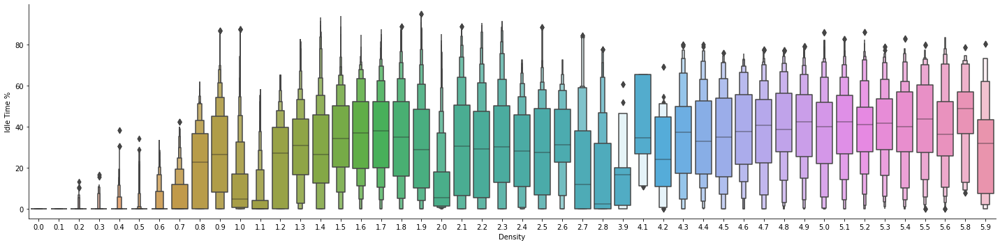

In [351]:
sns.catplot(data = data2, kind = "boxen", x = "Density", y ='Idle Time %', aspect = 4)

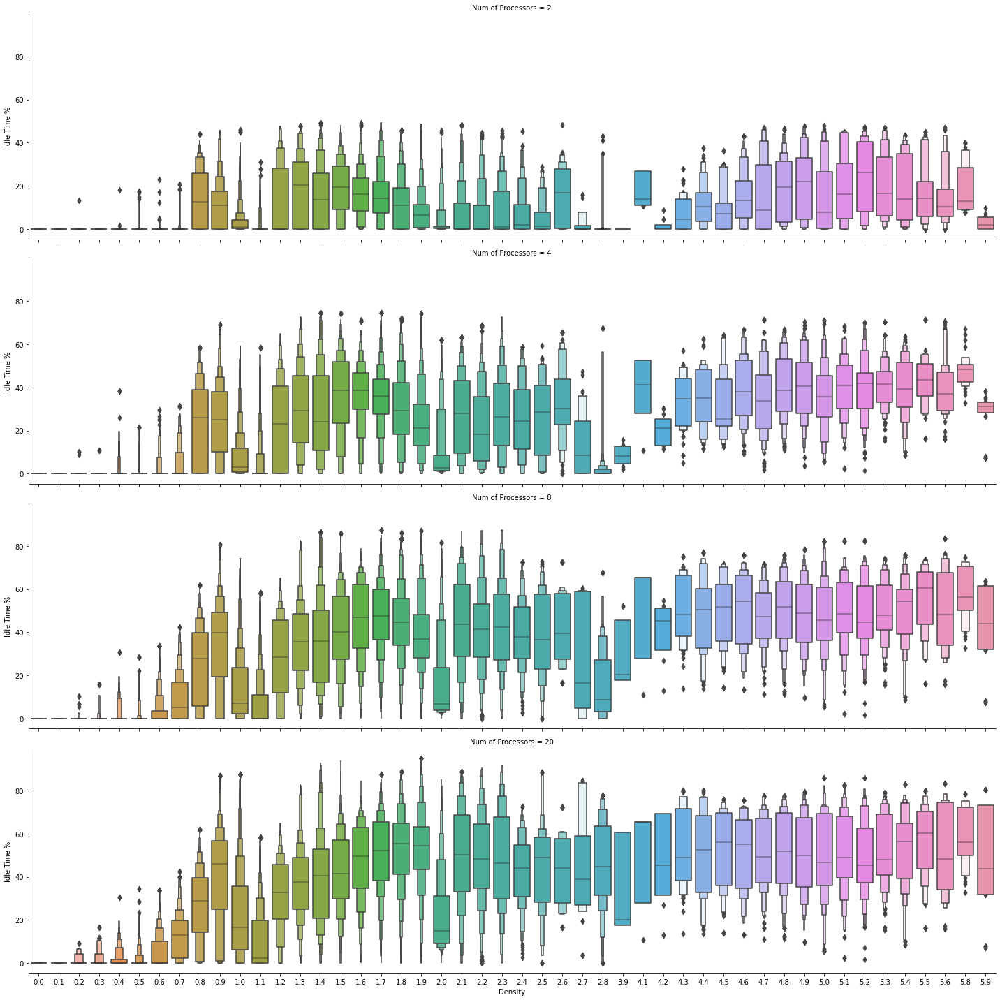

In [352]:
sns.catplot(data = data2, kind = "boxen", x = "Density", y ='Idle Time %', aspect = 4, row = "Num of Processors")

## Slack Chunk analysis

### By Graph Type

In [353]:
sortedbytype = data2.groupby("Graph Type", as_index= False)["Slack Chunk %"].median().sort_values(by = "Slack Chunk %")["Graph Type"]

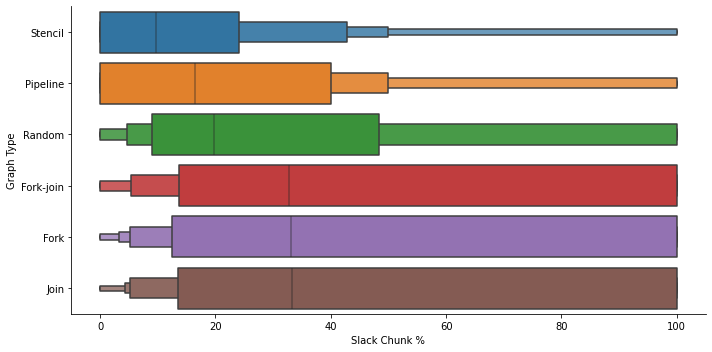

In [354]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", aspect = 2, order = sortedbytype)

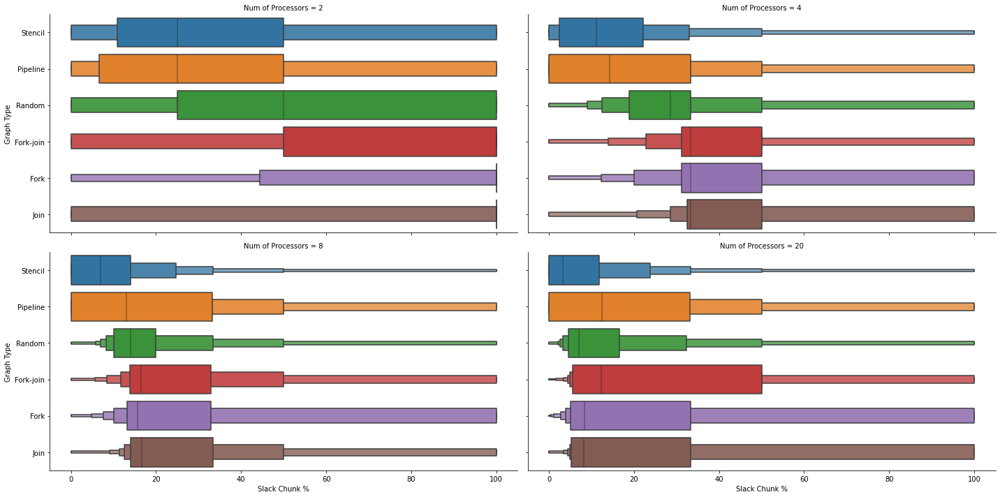

In [355]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", col = "Num of Processors", col_wrap= 2, aspect = 2,order = sortedbytype)

### By Scheduling algortihm

In [356]:
sortedbyalgorithm = data2.groupby("Algorithm", as_index= False)["Slack Chunk %"].mean().sort_values(by = "Slack Chunk %")["Algorithm"]

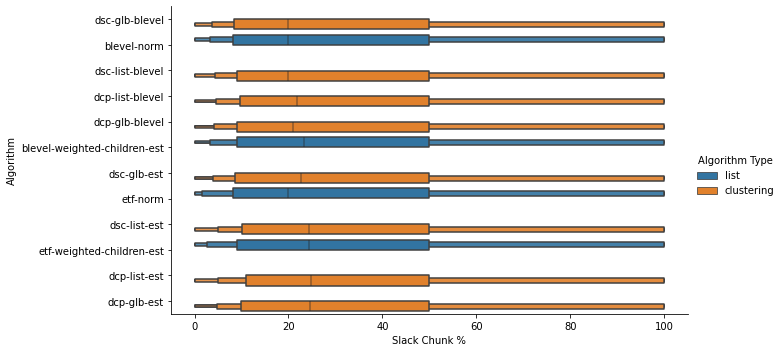

In [357]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Algorithm", hue = "Algorithm Type", aspect = 2, order = sortedbyalgorithm)

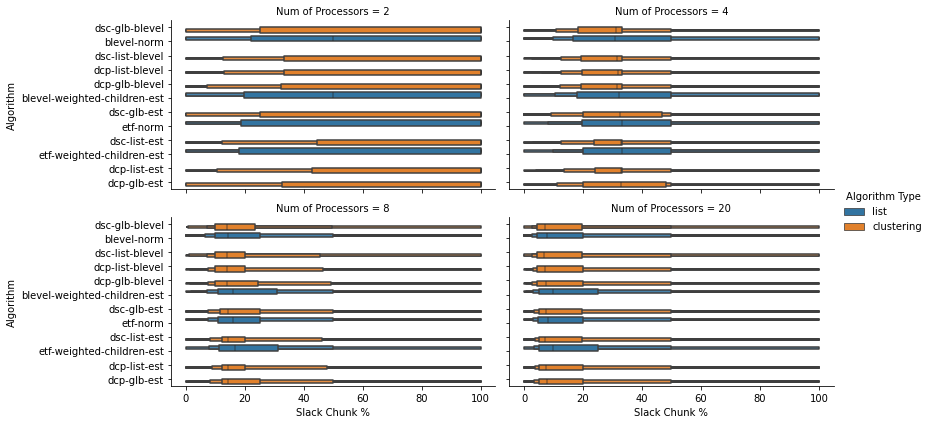

In [358]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Algorithm", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 3,aspect = 2, order = sortedbyalgorithm)

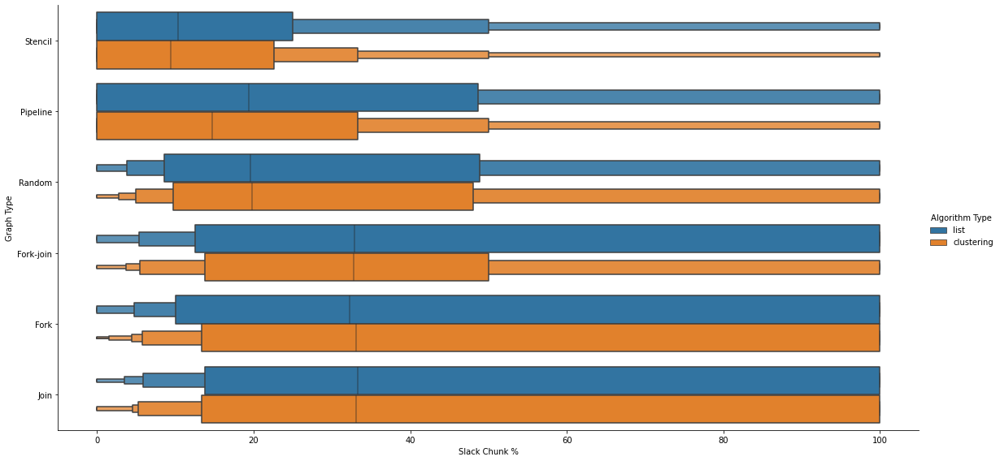

In [359]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", hue = "Algorithm Type",height = 8,aspect = 2, order = sortedbytype)

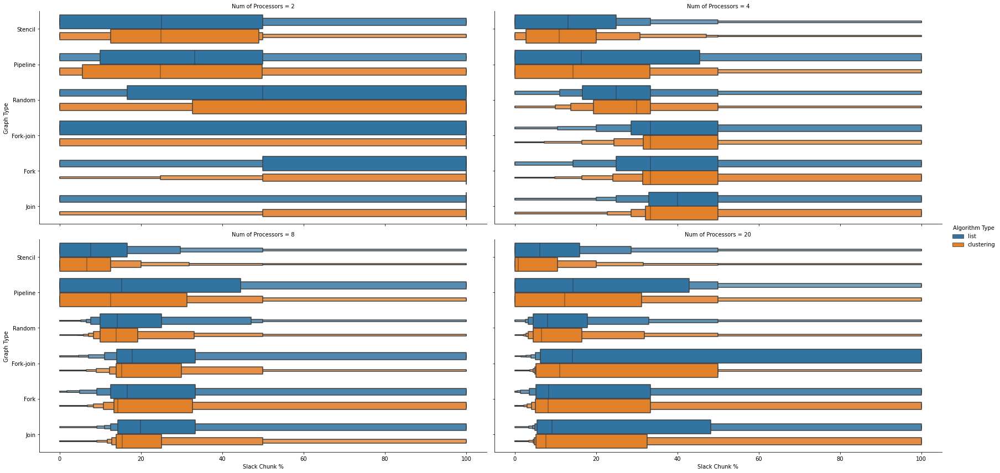

In [360]:
sns.catplot(data = data2 ,kind = "boxen", x = "Slack Chunk %", y = "Graph Type", hue = "Algorithm Type", col = "Num of Processors", col_wrap= 2 ,height = 6,aspect = 2, order = sortedbytype)

### By Efficiency

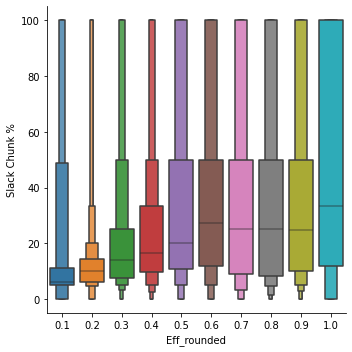

In [361]:
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Chunk %", x = "Eff_rounded")

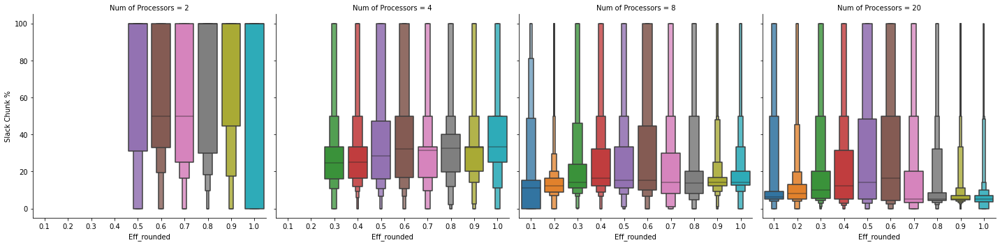

In [362]:
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Chunk %",col = "Num of Processors", x = "Eff_rounded")

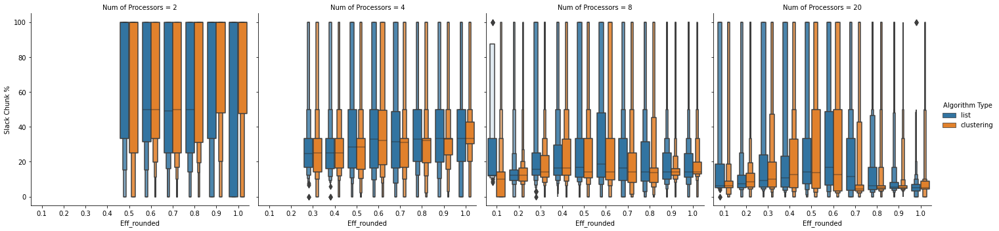

In [363]:
sns.catplot(data = data2 ,kind = "boxen", y = "Slack Chunk %",hue = "Algorithm Type",col = "Num of Processors", x = "Eff_rounded")